In [ ]:
import random
import numpy as np

random.seed(3311791)
np.random.seed(3311791)

# Application on Patent Claims

### Loading Data and preprocessing

In [ ]:
from google.colab import drive
import pandas as pd

drive.mount('/content/drive')
path_to_file = '/content/drive/My Drive/english_li_ion_patents.csv'

data = pd.read_csv(path_to_file)


Mounted at /content/drive


In [ ]:
import pandas as pd

#data = pd.read_csv('pilot_en_plus.csv') # if running code locally
df = data.copy(deep=True)
pattern = r'(?s)\[EN\](.*?)(?:\[[A-Z]{2}\]|$)' # anything between [EN] and ([any capital two letter combination] or end of string)
#pattern = r'\[EN\](.*?)(?:\[[A-Z]{2}\]|$)' # test anything between [EN] and ([any capital two letter combination] or end of string)

df['Claim_EN'] = df['Claims'].str.extract(pattern)
df['Abstract_EN'] = df['Abstract'].str.extract(pattern)
df['Title_EN'] = df['Title'].str.extract(pattern)
#df = df.dropna(subset=['Claim_EN'])


df['Application.Date'] = pd.to_datetime(df['Application.Date'])

df['Year'] = df['Application.Date'].dt.year

In [ ]:
# Split the 'Cooperative.Patent.Class' column into individual dummy columns
df['CPC'] = df['Cooperative.Patent.Class'].str.split('\r\n')

df['CPC_short'] = df['CPC'].apply(lambda x: [i[:1] for i in x] if isinstance(x, list) else x)
df['CPC_short']
df['CPC_unique'] = df['CPC_short'].apply(lambda x: list(set(x)) if isinstance(x, list) else x)
one_hot_encoded = pd.get_dummies(df['CPC_unique'].apply(pd.Series).stack()).sum(level=0)

df = pd.concat([df, one_hot_encoded], axis=1)
df

<ipython-input-20-96cde8e2c3f6>:7: FutureWarning: Using the level keyword in DataFrame and Series aggregations is deprecated and will be removed in a future version. Use groupby instead. df.sum(level=1) should use df.groupby(level=1).sum().
  one_hot_encoded = pd.get_dummies(df['CPC_unique'].apply(pd.Series).stack()).sum(level=0)


,Unnamed: 0,Application.Date,Country.Code,Probable.Patent.Assignee,Family.Number,Title,Priority.Dates,Abstract,Claims,Number.of.Forward.Citations,...,CPC_unique,A,B,C,D,E,F,G,H,Y
0,1,2014-02-06,AU,ENCELL TECHNOLOGY INC,57136128,[EN] BATTERY COMPRISING A COATED IRON ANODE AN...,2013-02-06\r\n2014-01-14\r\n2014-01-14\r\n2014...,[EN] The present invention provides one with a...,[EN] What is claimed is: 1. A battery comprisi...,0,...,"[H, Y]",0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
1,2,2014-02-06,AU,ENCELL TECHNOLOGY INC,57136128,[EN] BATTERY COMPRISING A COATED IRON ANODE AN...,2013-02-06\r\n2014-01-14\r\n2014-01-14\r\n2014...,[EN] The present invention provides one with a...,[EN] - 11 The Claims Defining the Invention ar...,0,...,"[H, Y]",0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
2,3,2014-02-06,AU,ENCELL TECHNOLOGY INC,57136128,[EN] PROCESS FOR FORMING A BATTERY CONTAINING ...,2013-02-06\r\n2013-11-08\r\n2014-02-06,[EN] Provided is a process for activating a ba...,[EN] What is claimed is: 1. A process for acti...,0,...,"[H, Y]",0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
3,4,2014-02-06,AU,ENCELL TECHNOLOGY INC,57136128,[EN] PROCESS FOR FORMING A BATTERY CONTAINING ...,2013-02-06\r\n2013-11-08\r\n2014-02-06,[EN] Provided is a process for activating a ba...,[EN] - 11 The Claims Defining The Invention Ar...,0,...,"[H, Y]",0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
4,5,2014-02-06,CA,ENCELL TECHNOLOGY INC,57136128,[EN] BATTERY COMPRISING A COATED IRON ANODE AN...,2013-02-06\r\n2014-01-14\r\n2014-01-14\r\n2014...,[EN] Iron electrodes have been used in energy ...,[EN] What is claimed is:1. A battery comprisin...,0,...,"[H, Y]",0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57047,226103,2020-08-18,EP,FUJIFILM HOLDINGS CORP,83545109,[EN] METHOD FOR PRODUCING MOLDED BODY FOR ELEC...,2019-08-19\r\n2020-08-18,[EN] A method of manufacturing a formed body f...,[EN] 1. A method of manufacturing a formed bod...,0,...,"[H, Y]",0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
57048,226107,2021-12-28,US,FUJIFILM HOLDINGS CORP,83545109,[EN] METHOD OF MANUFACTURING FORMED BODY FOR E...,2019-08-19\r\n2020-08-18\r\n2021-12-28,[EN] A method of manufacturing a formed body f...,[EN] 1. A method of manufacturing a formed bod...,0,...,"[H, Y]",0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
57049,226114,2017-01-11,US,FUJIFILM HOLDINGS CORP,61604174,"[EN] ALL SOLID-STATE SECONDARY BATTERY, INORGA...",2014-07-31\r\n2015-07-29\r\n2017-01-11,[EN] Provided are an all solid-state secondary...,[EN] 1. An all solid-state secondary battery c...,0,...,"[H, Y]",0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
57050,226115,2017-01-11,US,FUJIFILM HOLDINGS CORP,61604174,"[EN] ALL SOLID-STATE SECONDARY BATTERY, INORGA...",2014-07-31\r\n2015-07-29,[EN] Provided are an all solid-state secondary...,[EN] 1. An all solid-state secondary battery c...,12,...,"[H, Y]",0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0


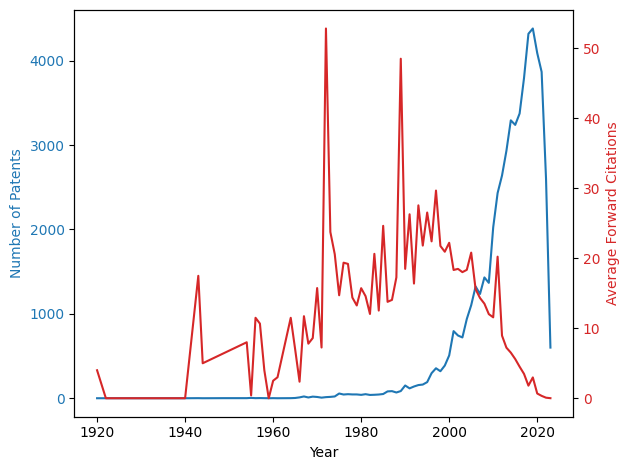

In [ ]:
import matplotlib.pyplot as plt
patents_per_year = df.groupby('Year').size()

# Average number of forward citations per year
avg_citations_per_year = df.groupby('Year')['Number.of.Forward.Citations'].mean()

fig, ax1 = plt.subplots()

color = 'tab:blue'
ax1.set_xlabel('Year')
ax1.set_ylabel('Number of Patents', color=color)
ax1.plot(patents_per_year.index, patents_per_year, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Average Forward Citations', color=color)
ax2.plot(avg_citations_per_year.index, avg_citations_per_year, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.show()

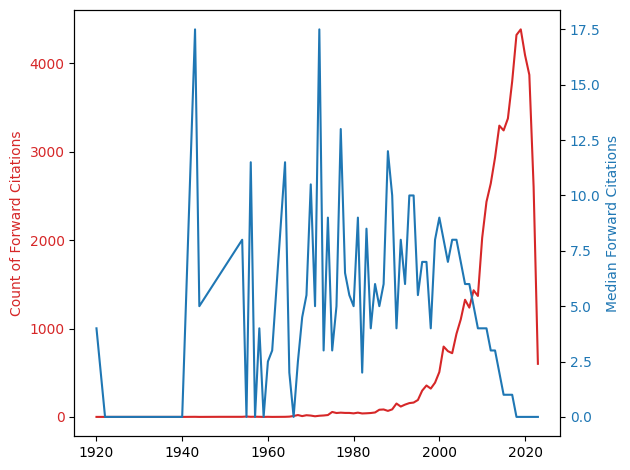

In [ ]:
# Median number of forward citations per year
median_citations_per_year = df.groupby('Year')['Number.of.Forward.Citations'].median()

# Count of forward citations per year
count_citations_per_year = df.groupby('Year')['Number.of.Forward.Citations'].count()

fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_ylabel('Count of Forward Citations', color=color)
ax1.plot(count_citations_per_year.index, count_citations_per_year, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_xlabel('Year')
ax2.set_ylabel('Median Forward Citations', color=color)
ax2.plot(median_citations_per_year.index, median_citations_per_year, color=color)
ax2.tick_params(axis='y', labelcolor=color)



fig.tight_layout()
plt.show()


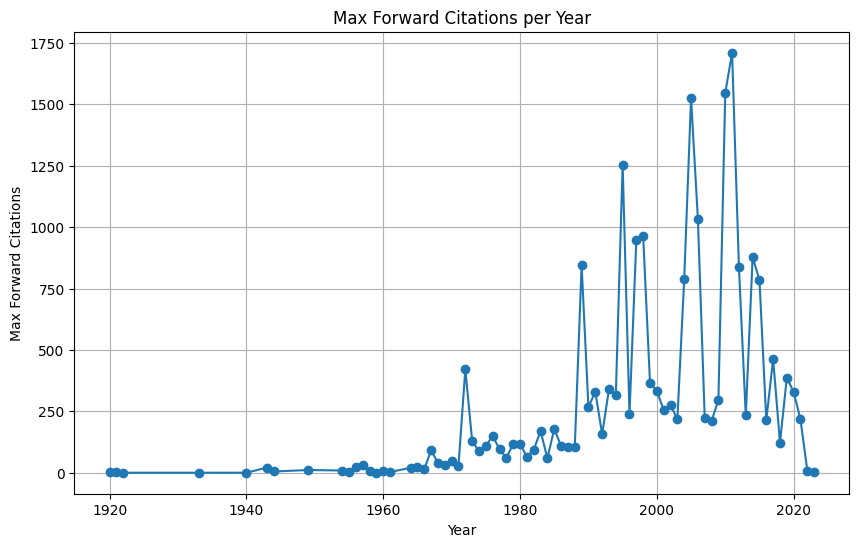

In [ ]:
# Maximum number of forward citations per year
max_citations_per_year = df.groupby('Year')['Number.of.Forward.Citations'].max()

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(max_citations_per_year.index, max_citations_per_year, marker='o', linestyle='-')
plt.xlabel('Year')
plt.ylabel('Max Forward Citations')
plt.title('Max Forward Citations per Year')
plt.grid(True)
plt.show()


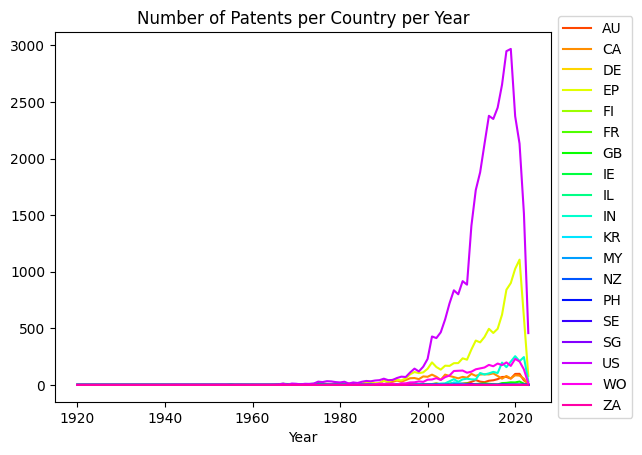

In [ ]:
patents_per_country_per_year = df.groupby(['Year', 'Country.Code']).size().unstack(fill_value=0)

# Plotting
patents_per_country_per_year.plot(kind='line', legend=True)
plt.title('Number of Patents per Country per Year')
plt.show()

In [ ]:
patents_per_assignee_per_year = df[df['Year']>=1990].groupby(['Year', 'Probable.Patent.Assignee']).size().unstack(fill_value=0)

# Plotting
patents_per_assignee_per_year.plot(kind='line', legend=True)
plt.title('Number of Patents per Assignee per Year')
plt.show()



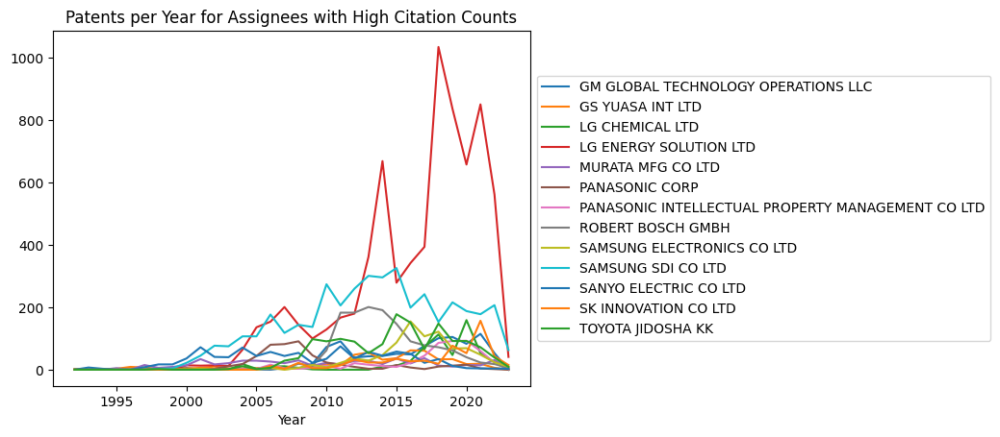

In [ ]:
citation_counts = df.groupby('Probable.Patent.Assignee')['Number.of.Forward.Citations'].count()
high_citation_assignees = citation_counts[citation_counts > 500]
filtered_df = df[df['Probable.Patent.Assignee'].isin(high_citation_assignees.index)]
patents_per_year = filtered_df[filtered_df['Year']>=1990].groupby(['Year', 'Probable.Patent.Assignee']).size().unstack(fill_value=0)
ax = patents_per_year.plot(kind='line')
ax.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.title('Patents per Year for Assignees with High Citation Counts')
plt.show()


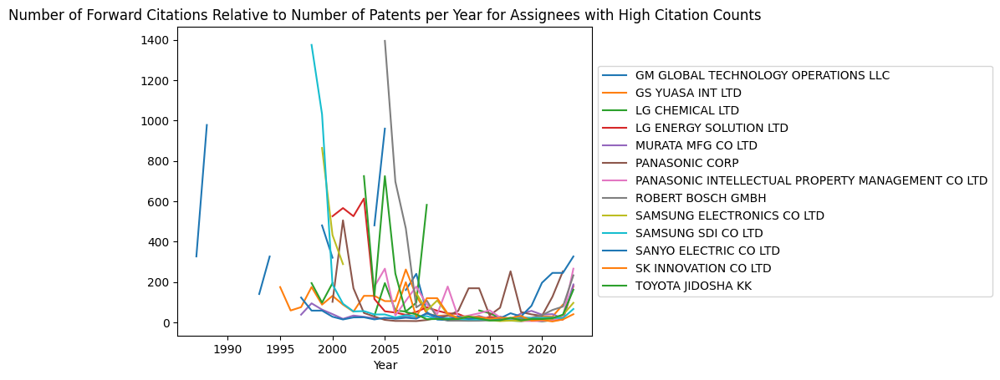

In [ ]:
citation_counts = df.groupby('Probable.Patent.Assignee')['Number.of.Forward.Citations'].count()
high_citation_assignees = citation_counts[citation_counts > 500]
filtered_df = df[df['Probable.Patent.Assignee'].isin(high_citation_assignees.index)]
patent_counts = filtered_df.groupby(['Year', 'Probable.Patent.Assignee']).size().unstack(fill_value=0)
relative_citations = citation_counts / patent_counts
relative_citations = relative_citations[relative_citations.columns.intersection(high_citation_assignees.index)]
ax = relative_citations.plot(kind='line')
ax.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.title('Number of Forward Citations Relative to Number of Patents per Year for Assignees with High Citation Counts')
plt.show()


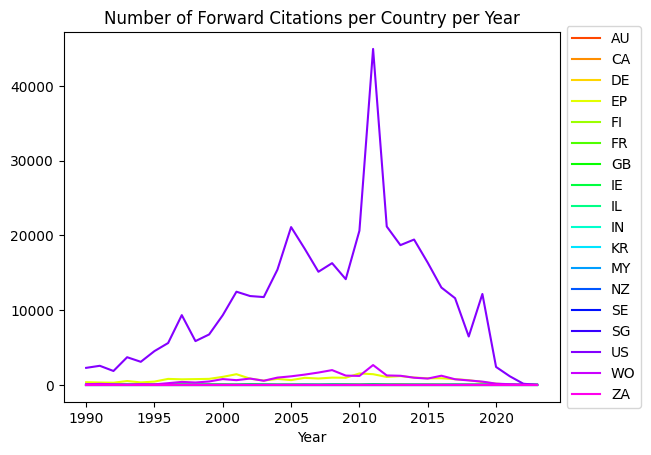

In [ ]:
citations_per_country_per_year = df[df['Year']>=1990].groupby(['Year', 'Country.Code'])['Number.of.Forward.Citations'].sum().unstack(fill_value=0)
citations_per_country_per_year.plot(kind='line')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.title('Number of Forward Citations per Country per Year')
plt.show()


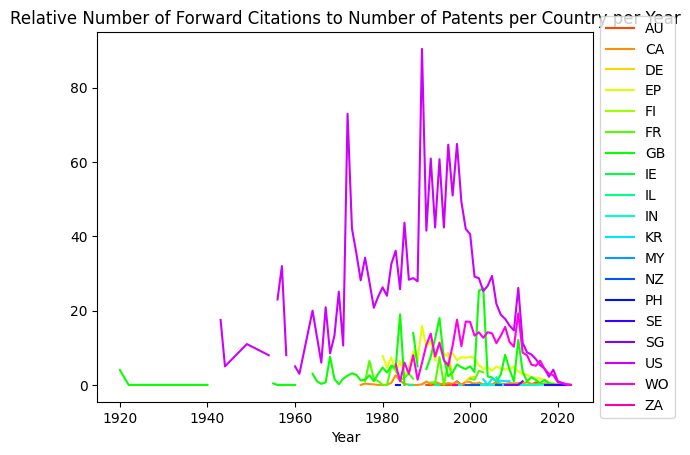

In [ ]:
import seaborn as sns

sns.set_palette(sns.color_palette("hsv", 20))
citations_per_country_per_year = df.groupby(['Year', 'Country.Code'])['Number.of.Forward.Citations'].sum().unstack(fill_value=0)
patents_per_country_per_year = df.groupby(['Year', 'Country.Code']).size().unstack(fill_value=0)
relative_citations_per_country_per_year = citations_per_country_per_year / patents_per_country_per_year
relative_citations_per_country_per_year.plot(kind='line')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.title('Relative Number of Forward Citations to Number of Patents per Country per Year')
plt.show()


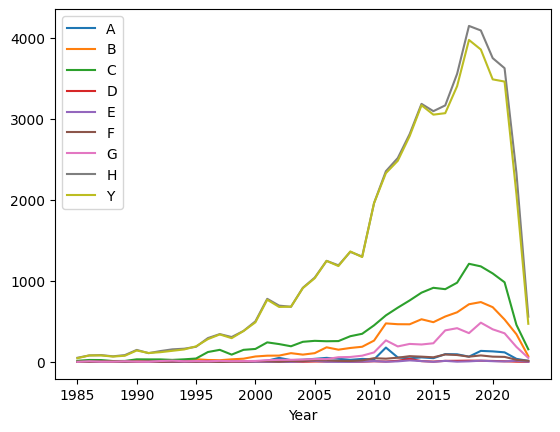

In [ ]:
columns_to_plot = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'Y']
patents_per_class_per_year = df[df['Year']>=1985].groupby('Year')[columns_to_plot].sum()
patents_per_class_per_year.plot(kind='line')
plt.show()
